In [22]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import interp_palette, magma
from bokeh.models import Legend

import matplotlib.pyplot as plt

from src.utils import get_signal_by_type, eye_experiment_sa_start, save_figure


import numpy as np 
from scipy.fftpack import fft, ifft
from scipy.signal import convolve, correlate, welch

output_notebook()

Loading BokehJS ...

In [17]:
plt.rcParams['figure.figsize']

[6.4, 4.8]

In [18]:
plt.rcParams['font.size']

7.0

In [19]:
plt.rcParams['figure.dpi']

100.0

# Stimulation artifacts

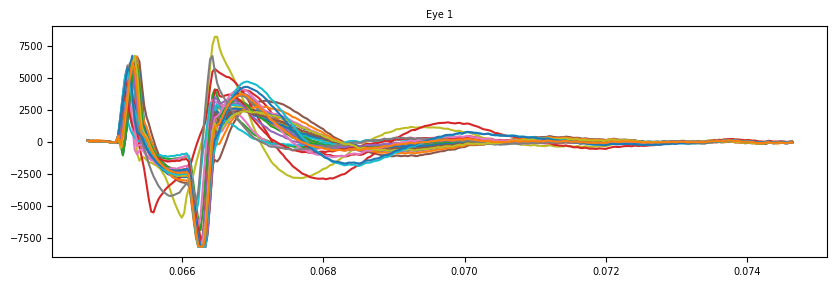

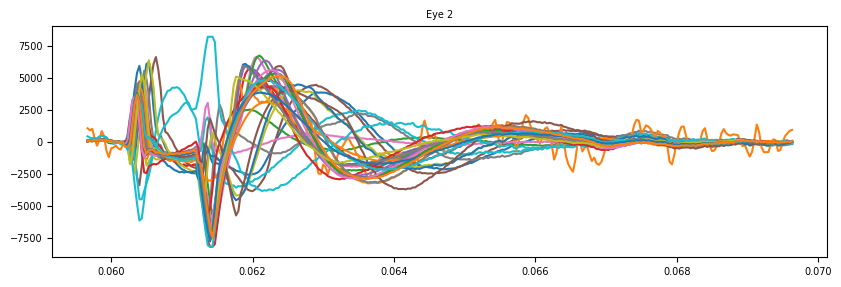

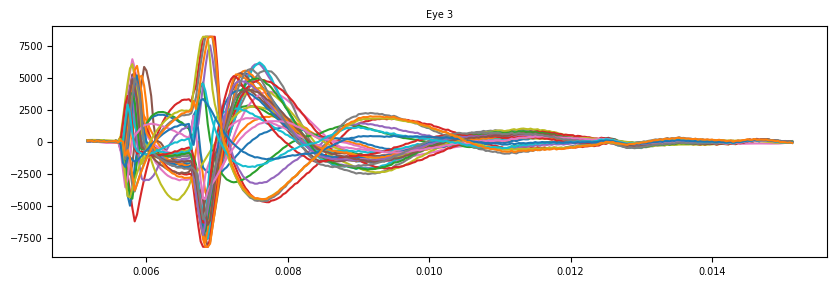

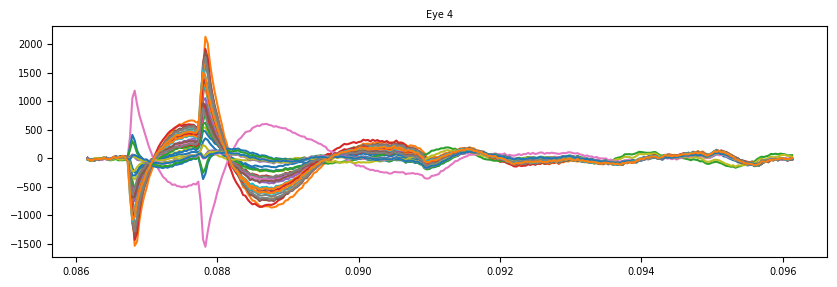

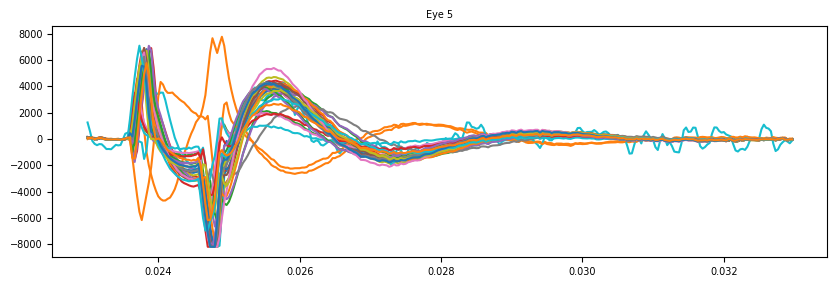

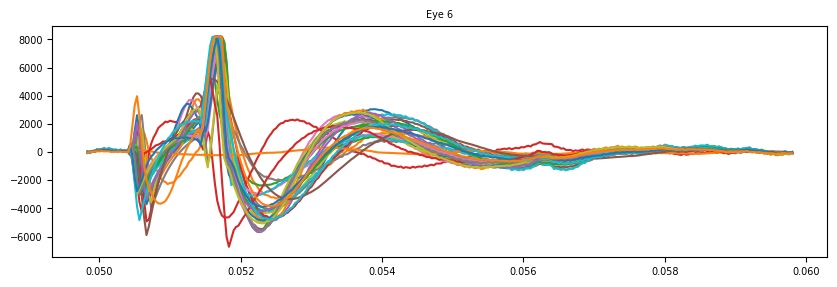

In [10]:
# just checking if indeed all start sa's are valid
design = '2D'
experiment = 'stimulated'
offset = 300 #num points

for eye in range(1, 7):
    time, signal = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
    sa_start = eye_experiment_sa_start[design][eye][experiment]
    sa = signal[sa_start:sa_start+offset]
    plt.figure(figsize=(10, 3))
    plt.plot(time[sa_start: sa_start+offset], sa)
    plt.title(f'Eye {eye}')
    plt.show()

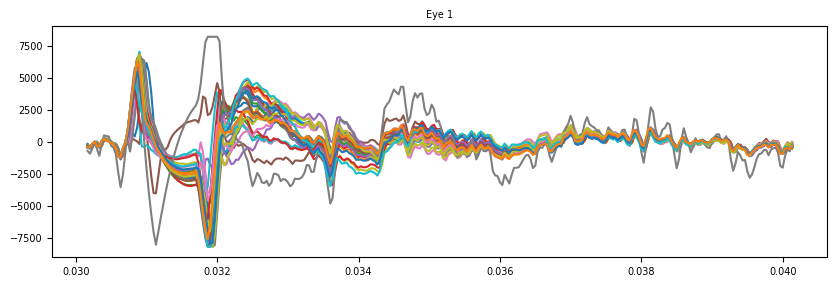

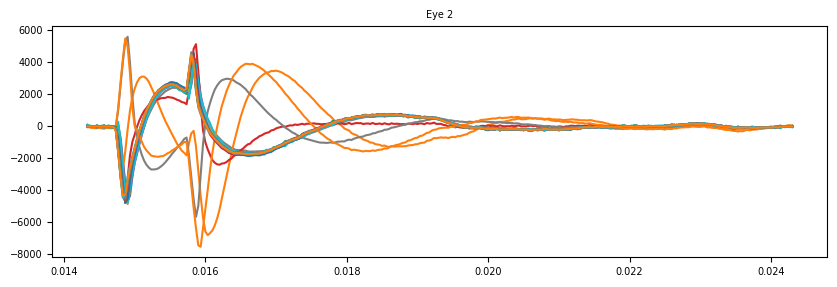

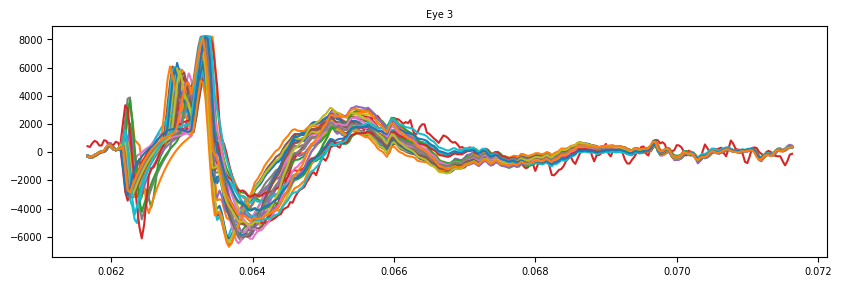

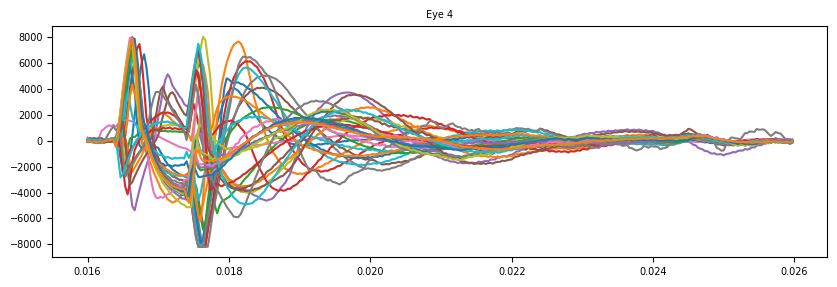

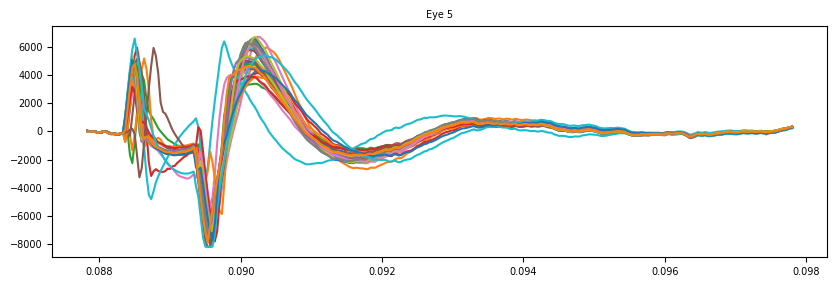

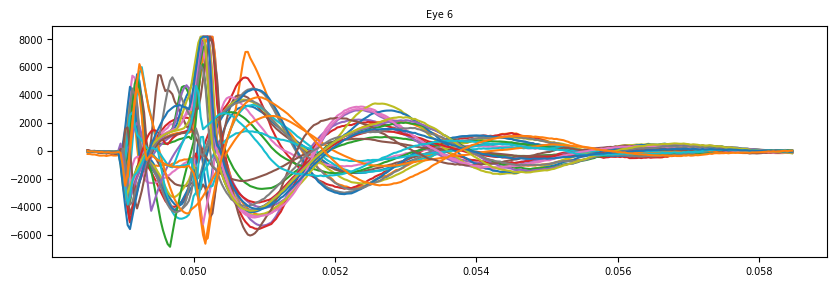

In [11]:
# just checking if indeed all start sa's are valid
design = '3D'
experiment = 'stimulated'
offset = 300 #num points

for eye in range(1, 7):
    time, signal = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
    sa_start = eye_experiment_sa_start[design][eye][experiment]
    sa = signal[sa_start:sa_start+offset]
    plt.figure(figsize=(10, 3))
    plt.plot(time[sa_start: sa_start+offset], sa)
    plt.title(f'Eye {eye}')
    plt.show()

# Understanding Welch's method

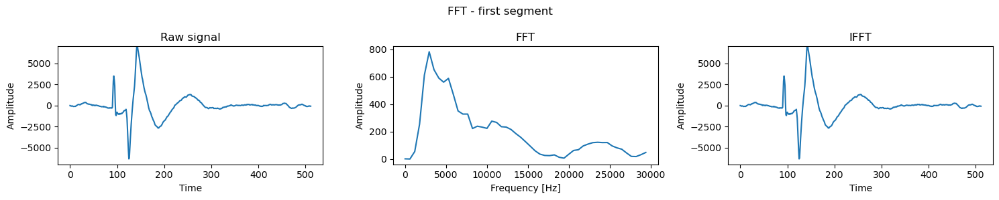

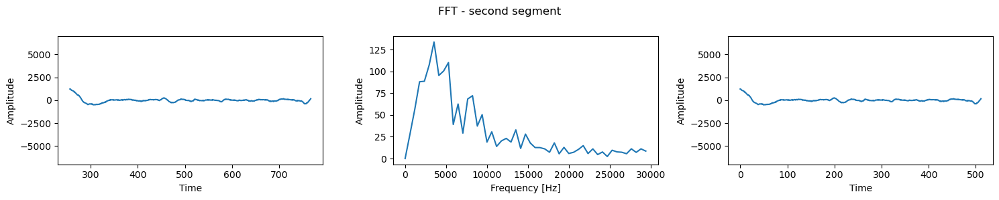

In [235]:
# do fft for one segment of the data (segment size = 256 points)
from scipy.fftpack import fft, ifft

fs = 300000
time, stimulated = get_signal_by_type(eye=6, design='3D', experiment='stimulated', verbose=0)
channel=1
first_point = 1380 #300 points

segment_size = 512

ylim = 7000
show_freq_fraction = 10

segment = stimulated[first_point:first_point+segment_size, channel]

n = len(segment)
f = np.linspace(0, fs, n)
yf = fft(segment)
y = ifft(yf)

fig, axs = plt.subplots(1, 3)
fig.suptitle('FFT - first segment')
fig.set_figwidth(15)
fig.set_figheight(3)

axs[0].plot(np.arange(0, segment_size), segment)
axs[0].set_title('Raw signal')
axs[0].set_ylabel('Amplitude')
axs[0].set_xlabel('Time')
axs[0].set_ylim(-ylim, ylim)

axs[1].plot(f[:n//show_freq_fraction], 2.0/n * np.abs(yf[0:n//10]))
axs[1].set_title('FFT')
axs[1].set_ylabel('Amplitude')
axs[1].set_xlabel('Frequency [Hz]')


axs[2].plot(np.real(y))
axs[2].set_title('IFFT')
axs[2].set_ylabel('Amplitude')
axs[2].set_xlabel('Time')
axs[2].set_ylim(-ylim, ylim)

plt.tight_layout()
plt.show()



segment = stimulated[first_point+segment_size//2:first_point+segment_size+segment_size//2, 3]
n = len(segment)
f = np.linspace(0, fs, n)
yf = fft(segment)
y = ifft(yf)

fig, axs = plt.subplots(1, 3)
fig.suptitle('FFT - second segment')
fig.set_figwidth(15)
fig.set_figheight(3)
axs[0].plot(np.arange(segment_size//2, segment_size+segment_size//2), segment)
axs[0].set_ylabel('Amplitude')
axs[0].set_xlabel('Time')
axs[0].set_ylim(-ylim, ylim)

axs[1].plot(f[:n//show_freq_fraction], 2.0/n * np.abs(yf[0:n//show_freq_fraction]))
axs[1].set_ylabel('Amplitude')
axs[1].set_xlabel('Frequency [Hz]')

axs[2].plot(np.real(y))
axs[2].set_ylabel('Amplitude')
axs[2].set_xlabel('Time')
axs[2].set_ylim(-ylim, ylim)
plt.tight_layout()
plt.show()



# Overall Power Spectral Density

## Deciding how wide of a window (nperseq) to use for PSD

this decision should be based on non-stimulated data, as the stimulated data will be overpowered by the SA anyways

In [237]:
time, signal = get_signal_by_type(experiment='stimulated', eye=2, design='3D', verbose=0)

fs = 30000
overlap = 0.5

for segment_size in [128, 256, 512, 700, 1024, 2048, 4096]:
    f, Pxx = welch(signal[:, 0], fs, nperseg=segment_size, noverlap=segment_size*overlap)
    p = figure(title=f"Power Spectrum (segment size {segment_size}, # points: {len(f)})", x_axis_label='frequency (Hz)', y_axis_label='Power', width=1200, height=400)
    p.line(f, Pxx, line_width=2)
    show(p)


## PSD with highest peak

2D
stimulated
non-stimulated
TTX

3D
stimulated
non-stimulated
TTX



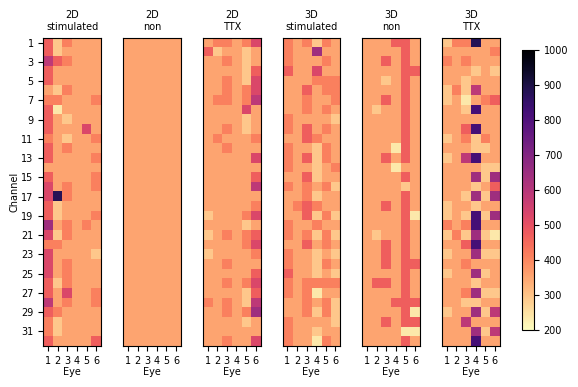

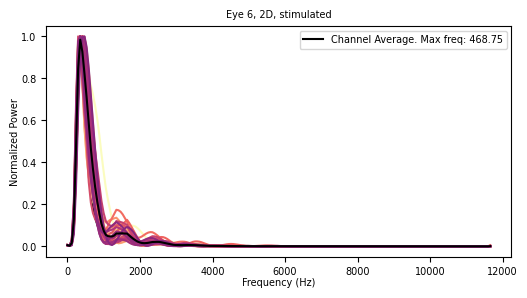

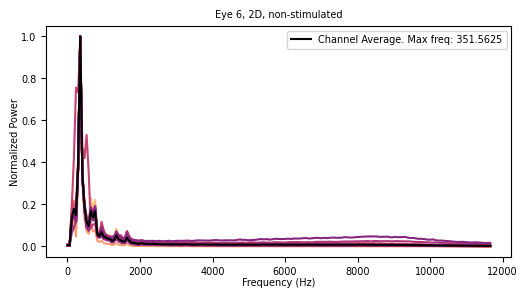

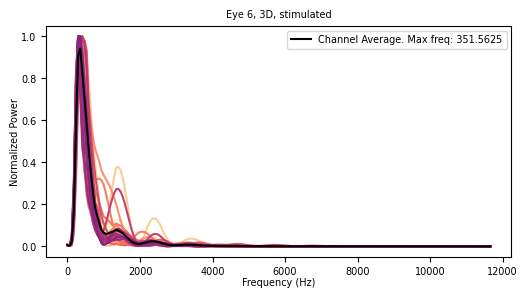

In [6]:
# plot all channels' power spectrum
eye = 1
design = '3D'
experiment = 'stimulated'

plots_to_save = {'eye': [6], 'design': ['3D', '2D'], 'experiment': ['stimulated', 'non-stimulated']}
show_individual_plots = False

fs = 30000


colors = interp_palette(magma(7), 50)

num_freq_to_show = 200

fig, ax = plt.subplots(1,6)
fig.set_figheight(10)
fig.set_figwidth(15)

for idx0, design in enumerate(['2D', '3D']):
    print(design)

    for idx, experiment in enumerate(['stimulated', 'non-stimulated', 'TTX']):
        print(experiment)
        peaks = []
        for eye in range(1,7):
            eye_peaks = []

            time, stimulated = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
            if eye in plots_to_save['eye'] and design in plots_to_save['design'] and experiment in plots_to_save['experiment']:
                #plt.figure()
                fig2, ax2 = plt.subplots(1, 1)
                ax2.set_title(f'Eye {eye}, {design}, {experiment}')
                ax2.set_xlabel('Frequency (Hz)')
                ax2.set_ylabel('Normalized Power')
                fig2.set_size_inches(6, 3)

            if show_individual_plots:
                p = figure(title=f"Eye {eye}, {design}, {experiment}", x_axis_label='frequency (Hz)', y_axis_label='Normalized Power', width=1200, height=400)
            items = []

            legenddict = {}
            average = np.zeros(num_freq_to_show)
            for i in range(32):
                f, Pxx = welch(stimulated[:, i], fs, nperseg=512)
                normalized_Pxx = Pxx/Pxx.max()
                if eye in plots_to_save['eye'] and design in plots_to_save['design'] and experiment in plots_to_save['experiment']:
                    plt.plot(f[:num_freq_to_show], normalized_Pxx[:num_freq_to_show], color=colors[-i])

                if show_individual_plots:
                    legenddict[f'Channel {i}'] = p.line(f[:num_freq_to_show], normalized_Pxx[:num_freq_to_show], line_width=1, color = colors[-i])
                    items.append((f'Channel {i}',[legenddict[f'Channel {i}']]))

                average += normalized_Pxx[:num_freq_to_show]
                
                eye_peaks.append(f[Pxx[:num_freq_to_show].argmax()])

            peaks.append(eye_peaks)

            if eye in plots_to_save['eye'] and design in plots_to_save['design'] and experiment in plots_to_save['experiment']:
                ax2.plot(f[:num_freq_to_show], average/32, color='black', label=f'Channel Average. Max freq: {f[Pxx.argmax()]}')
                ax2.legend()
                fig2.savefig(f'../../figures/{design}_{experiment}_power_spectrum.pdf', bbox_inches='tight')

            if show_individual_plots:
                p.line(f[:num_freq_to_show], average/32, line_width=2, color='black', legend_label=f'Channel Average. Max freq: {f[Pxx.argmax()]}')

                legend1 = Legend(
                    items=items[0:17],
                    label_text_font_size='8pt',
                    click_policy='hide',
                    location=(-10, 0))

                legend2 = Legend(
                    items=items[16:],
                    label_text_font_size='8pt',
                    click_policy='hide',
                    location=(-10, 0))
            
                p.add_layout(legend1, 'left')
                p.add_layout(legend2, 'left')
                show(p)

        peak_table = np.array(peaks)
        cax = ax[idx0*3+idx].imshow(peak_table.T, vmin=200, vmax=1000, cmap='magma_r')
        ax[idx0*3+idx].set_xticks(np.arange(6), np.arange(1, 7))
        ax[idx0*3+idx].set_xlabel(f'Eye')

        if idx == 0 and idx0 == 0:
            ax[idx].set_ylabel('Channel')
            every_other = (np.arange(32/2)*2).astype(int)
            ax[idx0*3+idx].set_yticks(every_other, every_other+1)
        else:
            ax[idx0*3+idx].set_yticks([], [])
        ax[idx0*3+idx].set_title(f'{design}\n{experiment.split("-")[0]}')
    print()
    
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(cax, cax=cbar_ax)
fig.set_size_inches(6, 4)
fig.savefig('../../figures/power_frequency_all_peaks.pdf', bbox_inches='tight')
plt.close()


## Peak detection

In [6]:
# higher than left and right method:

time, signal = get_signal_by_type(eye=6, design='3D', experiment='TTX', verbose=0)

fs = 30000

f, Pxx = welch(signal[:, 0], fs, nperseg=512)

first_n_flat = 7

peaks = (Pxx[:-1] > Pxx[1:]) & (Pxx[1:] < Pxx[:-1])

fig, ax = plt.subplots(1, 1)
ax.set_title('Power Spectrum Diff')
ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('Power')
ax.plot(f, Pxx, label='Power', zorder=1)


#p = figure(title="Power Spectrum Diff", x_axis_label='frequency (Hz)', y_axis_label='Power', width=1200, height=400,)
#p.line(f, Pxx, line_width=2, legend_label='Power')
#peaks = np.where((Pxx[:-1] > Pxx[1:]))[0]
#p.scatter(f[:-1][peaks], Pxx[:-1][peaks], size=10, color='red', legend_label='Higher than next one')
#peaks = np.where(Pxx[1:] > Pxx[:-1])[0][:-1]+1
#p.scatter(f[:-1][peaks], Pxx[:-1][peaks], size=5, color='orange', legend_label='Higher than previus one')
peaks = np.roll((Pxx[1:] > Pxx[:-1]), 1) & (Pxx[:-1] > Pxx[1:])
#p.scatter(f[:-1][peaks], Pxx[:-1][peaks], size=5, color='black', legend_label='Higher than next AND previous')
ax.scatter(f[:-1][peaks], Pxx[:-1][peaks], s=5, c='black', label='Higher than next AND previous', zorder=2)
ax.legend()
fig.set_size_inches(6, 2)
fig.savefig('../../figures/peak_detection_stimulated.png', bbox_inches='tight')
plt.close(fig)
#show(p)


time, signal = get_signal_by_type(eye=6, design='3D', experiment='non-stimulated', verbose=0)

fs = 30000

f, Pxx = welch(signal[:, 0], fs, nperseg=512)

peaks = (Pxx[:-1] > Pxx[1:]) & (Pxx[1:] < Pxx[:-1])
fig2, ax2 = plt.subplots(1, 1)
ax2.set_title('Power Spectrum Diff')
ax2.set_xlabel('Frequency (Hz)')
ax2.set_ylabel('Power')
ax2.plot(f, Pxx, label='Power', zorder=1)
#p = figure(title="Power Spectrum Diff", x_axis_label='frequency (Hz)', y_axis_label='Power', width=1200, height=400)
#p.line(f, Pxx, line_width=2, legend_label='Power')
peaks = np.roll((Pxx[1:] > Pxx[:-1]), 1) & (Pxx[:-1] > Pxx[1:])
#p.scatter(f[:-1][peaks], Pxx[:-1][peaks], size=5, color='black', legend_label='Higher than next AND previous')
ax2.scatter(f[:-1][peaks], Pxx[:-1][peaks], s=5, c='black', label='Higher than next AND previous', zorder=2)
ax2.legend()
fig2.set_size_inches(6, 2)
fig2.savefig('../../figures/peak_detection_non-stimulated.png', bbox_inches='tight')
plt.close(fig2)
#show(p)


# we have also tried diff method, but it was worse


## PSD with all peaks

3D


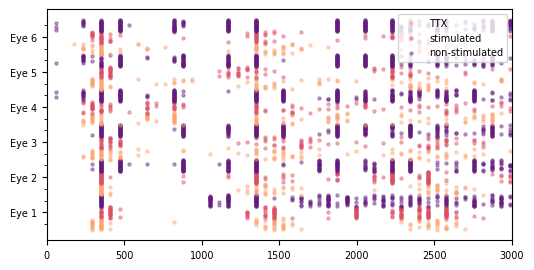

2D


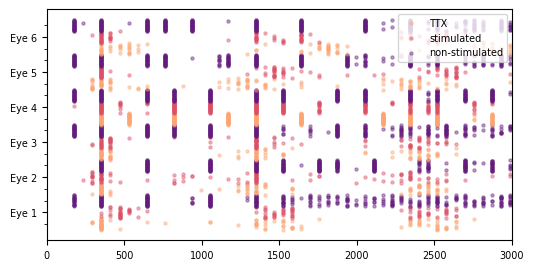

In [11]:
import matplotlib.ticker as ticker

first_n_peaks = 15
colors = {'non-stimulated': '#651b7e', 'stimulated': '#dd4f66', 'TTX': '#fca572'}

from bokeh.models import FixedTicker
num_freq_to_show = 200
fs = 30000
nperseq = 512
experiments = ['non-stimulated', 'stimulated', 'TTX']
show_bokeh_figure = False

for idx0, design in enumerate(['3D', '2D']):
    ttx_flag = nostim_flag = stim_flag = True
    print(design)
    if show_bokeh_figure:
        p = figure(title=f"Frequency peaks {design}", x_axis_label= 'Frequency [Hz]', y_axis_label='Eyes, experiments, channels', width=1200, height=600, x_range=(0, 3000))
    fig, ax = plt.subplots(1, 1)
    fig.set_size_inches(6, 3)
    ax.set_xlim(0, 3000)
    ticks = []
    minorticks = []
    legend_items = []
    for eye in range(1,7):        
        
        for idx, experiment in enumerate(experiments):
            #print(experiment)
            
            time, stimulated = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
            items = []
            legenddict = {}
            average = np.zeros(num_freq_to_show)
            
            for i in range(32):
                f, Pxx = welch(stimulated[:, i], fs, nperseg=nperseq)
                normalized_Pxx = Pxx/Pxx.max()

                df = f[:-1]
                dy = np.diff(normalized_Pxx)

                #where dy crosses 0
                crossings = np.where(np.diff(np.sign(dy)))[0]
                peaks = np.roll((Pxx[1:] > Pxx[:-1]), 1) & (Pxx[:-1] > Pxx[1:])

                y_offset = (idx*32)+(eye-1)*32*3
                if show_bokeh_figure:
                    line = p.scatter(f[:-1][peaks][:first_n_peaks], np.ones(first_n_peaks)*i+y_offset, color=colors[experiment], size=5, alpha=0.4, legend_label=experiment)
                    
                    if eye == 1 and i == 0:
                        legend_items.append(line)

                if eye == 1 and i == 0:
                    ax.scatter(f[:-1][peaks][:first_n_peaks], np.ones(first_n_peaks)*i+y_offset, s=5, alpha=0.4, edgecolors=None, c=colors[experiment], label=experiment)
                else:
                    ax.scatter(f[:-1][peaks][:first_n_peaks], np.ones(first_n_peaks)*i+y_offset, s=5, alpha=0.4, edgecolors=None, c=colors[experiment])

            minorticks.append(16 + y_offset)
        ticks.append(y_offset-16)
    if show_bokeh_figure:
        p.yaxis.ticker = FixedTicker(ticks=ticks, minor_ticks=minorticks)
        p.ygrid.minor_grid_line_color = 'lightgray'
        p.yaxis.major_label_overrides = {x: f"Eye {eye_no}" for x, eye_no in zip(ticks, np.arange(1, 7))}
        legend = Legend(items = [(experiments[i], [legend_items[i]]) for i in range(3)])
        p.xaxis.ticker.desired_num_ticks = 20
        show(p)

    #ax set minor ticks
    ax.yaxis.set_major_locator(ticker.FixedLocator(ticks))  # Set major ticks
    ax.yaxis.set_minor_locator(ticker.FixedLocator(minorticks)) 
    ax.yaxis.set_major_formatter(ticker.FixedFormatter([f"Eye {i}" for i in np.arange(1, 7)])) 
    plt.legend(loc = 'upper right')
    plt.show()

# Compare SA vs response PSD

### Exact offset 3000 points (Jespers clean data method)

In [13]:
template_length = 300
response_length = 2700 # todo: check if there is an sa within the period

In [50]:
with_individual_plots = False
design = '3D'
colors = {'stimulated':{'response': '#651b7e', 'sa': '#fca572'}, 
          'TTX':{'response': '#b83776', 'sa': '#fdd598'}
}


fig, axs = plt.subplots(2, 3, figsize=(17, 8), constrained_layout=True)
fig.suptitle(f'FFT {design}')

lines = []

for eye in range(1, 7):
    for experiment in ['stimulated', 'TTX']:
        time, signals = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
        pos = (eye-1) // 3, (eye-1) % 3
        axs[pos[0]][pos[1]].set_title(f'Eye {eye}')

        channel_mean_sa = []
        channel_mean_response = []

        for channel in range(32):
            signal = signals[:, channel]

            if experiment == 'non-stimulated':
                sa_start = 0
            else:
                sa_start = eye_experiment_sa_start[design][eye][experiment]


            for i in range(99):
                sa_template = signal[sa_start:sa_start+template_length]
                response_period = signal[sa_start+template_length:sa_start+template_length+response_length]
                # fft of sa_template - we pad it so that it has the same length as the response_period (same frequency resolution)
                sa_template_padded = np.pad(sa_template, (0, response_length-template_length), 'constant')
                sa_template_fft = np.abs(fft(sa_template_padded)[:len(sa_template_padded)//2])
                response_period_fft = np.abs(fft(response_period)[:len(response_period)//2])
                
                if i == 0:
                    sa_templates = sa_template
                    response_periods = response_period

                    sa_template_ffts = sa_template_fft
                    response_period_ffts = response_period_fft
                else:
                    sa_templates = np.vstack((sa_templates, sa_template))
                    response_periods = np.vstack((response_periods, response_period))

                    sa_template_ffts = np.vstack((sa_template_ffts, sa_template_fft))
                    response_period_ffts = np.vstack((response_period_ffts, response_period_fft))

                sa_start += 3000

            if with_individual_plots:
                plt.figure(figsize=(4, 3))
                plt.plot(sa_templates.T, alpha=0.3, color=colors['TTX']['sa'])
                plt.plot(sa_templates.mean(axis=0), color=colors['stimulated']['sa'])
                plt.title('SA templates')
                plt.show()

                plt.figure(figsize=(20, 3))
                plt.plot(response_periods.T, alpha=0.3, color=colors['TTX']['response'])
                plt.plot(response_periods.mean(axis=0), color=colors['stimulated']['response'])
                plt.title('response periods')
                plt.show()

                plt.figure(figsize=(10, 5))
                plt.semilogy(response_period_ffts.T, alpha=0.1, color=colors['TTX']['response'])
                plt.semilogy(response_period_ffts.mean(axis=0), color=colors['stimulated']['response'])
                plt.semilogy(sa_template_ffts.T, alpha=0.1, color=colors['TTX']['sa'])
                plt.semilogy(sa_template_ffts.mean(axis=0), color=colors['stimulated']['sa'])
                plt.title(f'FFT - {design}, Eye {eye}, {experiment}')
                plt.show()

            channel_mean_response.append(response_period_ffts.mean(axis=0))
            channel_mean_sa.append(sa_template_ffts.mean(axis=0))
        #axis labels
        axs[pos[0]][pos[1]].set_xlabel('Frequency [Hz]')
        axs[pos[0]][pos[1]].set_ylabel('Power [log(|mV|)]')

        line = axs[pos[0]][pos[1]].semilogy(np.mean(channel_mean_response, axis=0), color=colors[experiment]['response'], label=f"{experiment} - response ")
        line2 = axs[pos[0]][pos[1]].semilogy(np.mean(channel_mean_sa, axis=0), color=colors[experiment]['sa'], label=f"{experiment} - SA ")

        lines.append(line[0])
        lines.append(line2[0])

#fig.legend(bbox_to_anchor=(-0, -1), ncol=4)
fig.legend(lines[-4:], ['stimulated - response', 'stimulated - SA', 'TTX - response', 'TTX - SA'], 
           loc='upper right', bbox_to_anchor=(0, 0), ncol=4)
save_figure("3D_SA_vs_response_freq", height=3.5)
plt.show()




### Template convolution (Theresas method)

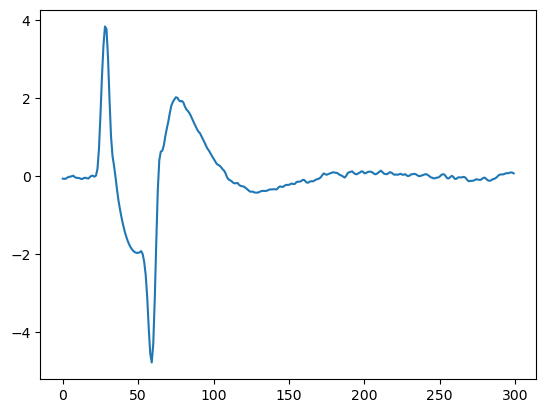

In [ ]:
# now use the first stimulation artefact of each eye, each channel as a template and do template convolution


eye = 1
design = '3D'
experiment = 'stimulated'
channel = 1
template_length = 300

time, signal = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
signal = signal[:, channel]
#sa_start = eye_experiment_sa_start[design][eye][experiment]
sa_start = 900
# get next 90 templates with 3000 points offset from each other length 300 per template and average them
for i in range(90):
    sa_template = signal[sa_start:sa_start+template_length]
    if i == 0:
        sa_templates = sa_template
    else:
        sa_templates = np.vstack((sa_templates, sa_template))
    sa_start += 3000
sa_template = sa_templates.mean(axis=0)
sa_template = sa_template/sa_template.std()
plt.plot(sa_template)
plt.show()


time, signal = get_signal_by_type(eye=eye, design=design, experiment=experiment, verbose=0)
# moving average of signal
signal = signal[:, channel]


signal = signal/signal.std()

p = figure(title=f"Eye {eye}, design {design}, experiment {experiment}, channel {channel}", x_axis_label='Voltage [mV]', y_axis_label='Time [s]', 
           width=1200, height=400)
p.line(time, signal, line_width=2, legend_label='signal')
sa_detection = convolve(signal, sa_template, mode='same')
# roll with half the length
sa_detection = np.roll(sa_detection, len(sa_detection)//2)

p.line(time, sa_detection/sa_detection.std(), line_width=2, color='red', legend_label='convolved signal')
p.legend.location = "top_left"
p.legend.click_policy="hide"
show(p)




In [ ]:
sa_detection.min()

-573.77203